In [ ]:
!pip install "numpy<2.0"
!pip install pmdarima
!pip install scipy
!pip install statsmodels
!pip install matplotpib
!pip install --upgrade pip

In [25]:
!pip install matplotlib

   ---------------------------------------- 0.0/8.1 MB ? eta -:--:--
   --- ------------------------------------ 0.8/8.1 MB 5.6 MB/s eta 0:00:02
   ---------------- ----------------------- 3.4/8.1 MB 11.2 MB/s eta 0:00:01
   --------------------------- ------------ 5.5/8.1 MB 11.2 MB/s eta 0:00:01
   ---------------------------------------- 8.1/8.1 MB 12.2 MB/s eta 0:00:00
   ---------------------------------------- 0.0/2.2 MB ? eta -:--:--
   ---------------------------------------- 2.2/2.2 MB 17.7 MB/s eta 0:00:00
   ---------------------------------------- 0.0/2.7 MB ? eta -:--:--
   ---------------------------------------- 2.7/2.7 MB 17.1 MB/s eta 0:00:00

   ---------------------------------------- 0/7 [pyparsing]
   ----- ---------------------------------- 1/7 [pillow]
   ----- ---------------------------------- 1/7 [pillow]
   ----- ---------------------------------- 1/7 [pillow]
   ----- ---------------------------------- 1/7 [pillow]
   ----- ----------------------------------

In [17]:
import numpy as np
import pandas as pd
from pmdarima.arima import auto_arima
from sklearn.metrics import mean_absolute_percentage_error, root_mean_squared_error, r2_score
from statsmodels.tsa.statespace.sarimax import SARIMAX

Получим данные:

In [8]:
df_train = pd.read_csv('train.csv')
df_test = pd.read_csv('test.csv')

In [9]:
df_train.head()

,Date,store,product,number_sold
0,2010-01-01,0,0,801
1,2010-01-02,0,0,810
2,2010-01-03,0,0,818
3,2010-01-04,0,0,796
4,2010-01-05,0,0,808


In [10]:
stores = sorted(df_train['store'].unique())
print(len(stores))
products = sorted(df_train['product'].unique())
print(len(products))

7
10


In [21]:
# Для избавления от FutureWarning

from warnings import filterwarnings
filterwarnings("ignore")

In [22]:
results = []
for product in products:
    for store in stores:
        subset_train = df_train[(df_train['store'] == store) & (df_train['product'] == product)].copy()
        subset_test = df_test[(df_test['store'] == store) & (df_test['product'] == product)].copy()

        if subset_test.empty:
            continue

        subset_train.set_index('Date', inplace=True)
        subset_train.index = pd.to_datetime(subset_train.index)
        subset_test.set_index('Date', inplace=True)
        subset_test.index = pd.to_datetime(subset_test.index)

        subset_train = subset_train.asfreq('D')

        aux_model = auto_arima(subset_train['number_sold'], seasonal=True, m=7,
                          start_p=0, start_q=0, max_p=3, max_q=3,
                          start_P=0, start_Q=0, max_P=2, max_Q=2,
                          trace=False,
                          error_action='ignore',
                          suppress_warnings=True,
                          stepwise=True)

        model = SARIMAX(subset_train['number_sold'], order=aux_model.order, 
                        seasonal_order=aux_model.seasonal_order,
                        enforce_invertibility=False,
                        enforce_stationarity=False,
                        freq='D')

        model_fit = model.fit(disp=False)

        forecast = model_fit.get_forecast(steps=len(subset_test))
        predicted_values = forecast.predicted_mean 

        mape = mean_absolute_percentage_error(subset_test['number_sold'], predicted_values)
        rmse = root_mean_squared_error(subset_test['number_sold'], predicted_values)
        r2 = r2_score(subset_test['number_sold'], predicted_values)

        results.append(pd.DataFrame({
            'store': store,
            'product': product,
            'Date': subset_test.index,
            'Factual': subset_test['number_sold'],
            'Forecast': predicted_values,
            'mape': mape,
            'rmse': rmse,
            'r2': r2
        }))
        print(f'Product {str(product)}; Store {str(store)}')

results_final = pd.concat(results, ignore_index=True)

Product 0; Store 0
Product 0; Store 1
Product 0; Store 2
Product 0; Store 3
Product 0; Store 4
Product 0; Store 5
Product 0; Store 6
Product 1; Store 0
Product 1; Store 1
Product 1; Store 2
Product 1; Store 3
Product 1; Store 4
Product 1; Store 5
Product 1; Store 6
Product 2; Store 0
Product 2; Store 1
Product 2; Store 2
Product 2; Store 3
Product 2; Store 4
Product 2; Store 5
Product 2; Store 6
Product 3; Store 0
Product 3; Store 1
Product 3; Store 2
Product 3; Store 3
Product 3; Store 4
Product 3; Store 5
Product 3; Store 6
Product 4; Store 0
Product 4; Store 1
Product 4; Store 2
Product 4; Store 3
Product 4; Store 4
Product 4; Store 5
Product 4; Store 6
Product 5; Store 0
Product 5; Store 1
Product 5; Store 2
Product 5; Store 3
Product 5; Store 4
Product 5; Store 5
Product 5; Store 6
Product 6; Store 0
Product 6; Store 1
Product 6; Store 2
Product 6; Store 3
Product 6; Store 4
Product 6; Store 5
Product 6; Store 6
Product 7; Store 0
Product 7; Store 1
Product 7; Store 2
Product 7; S

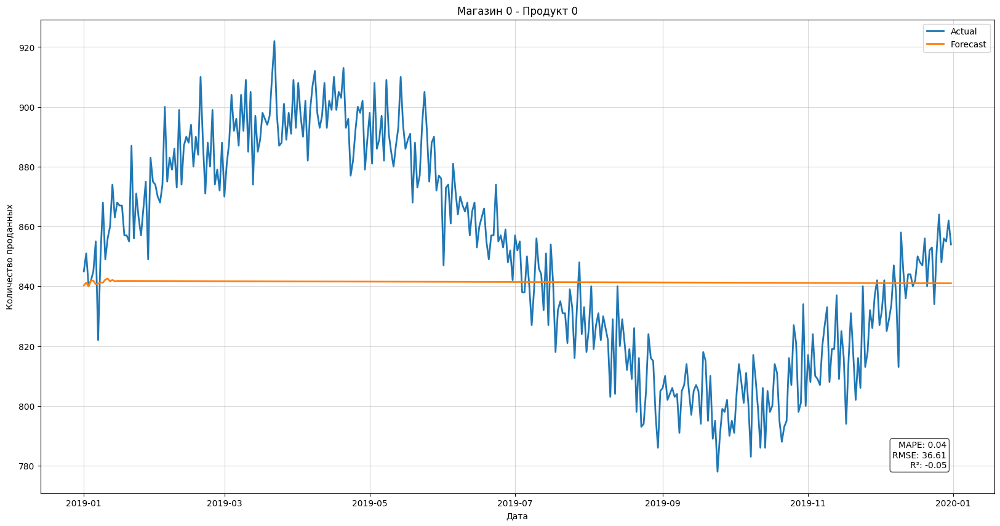

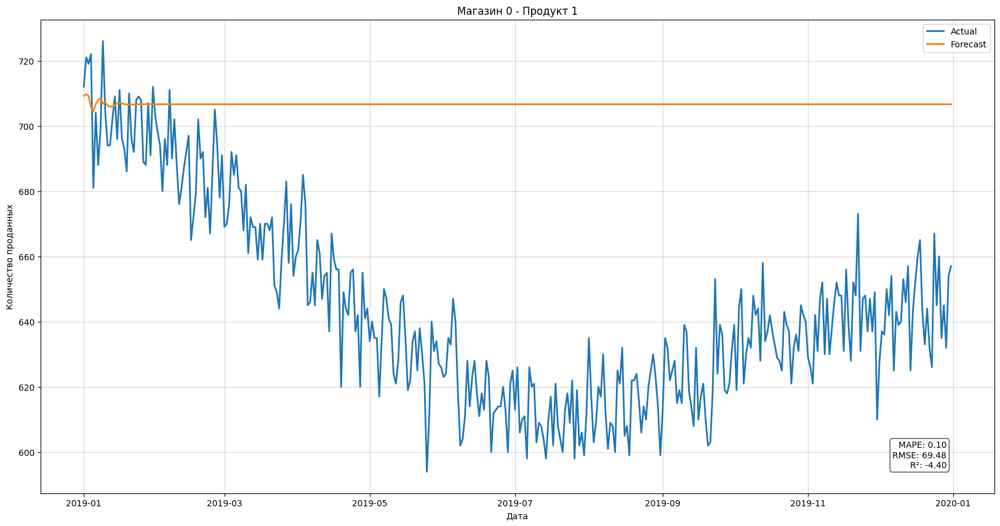

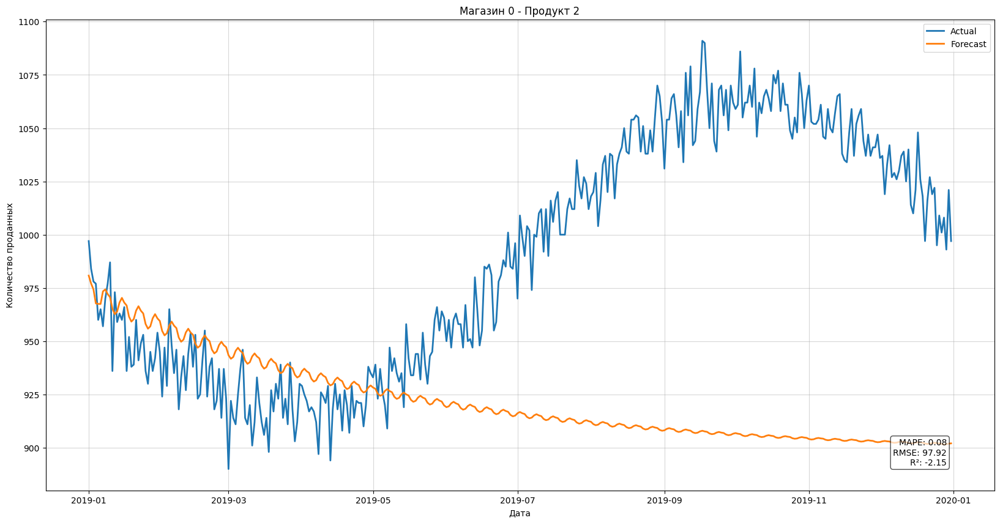

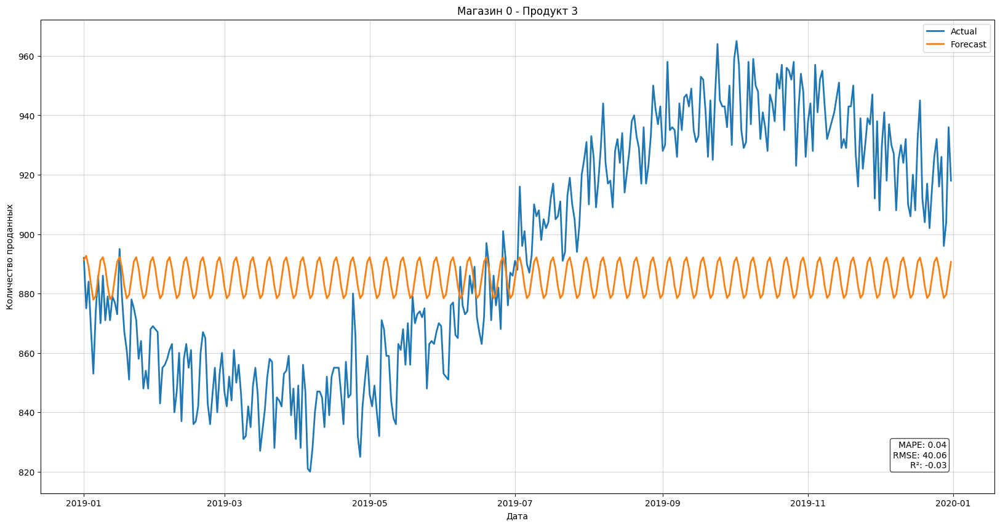

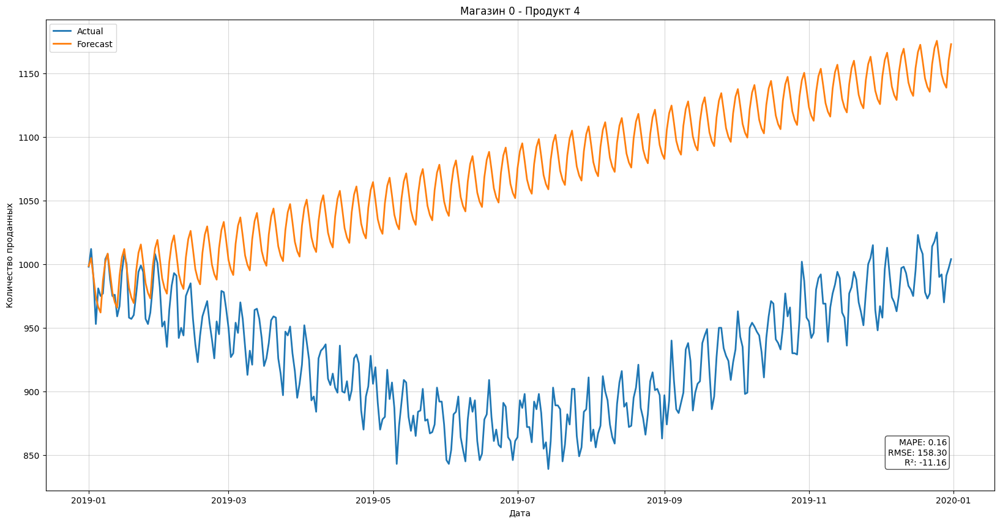

...

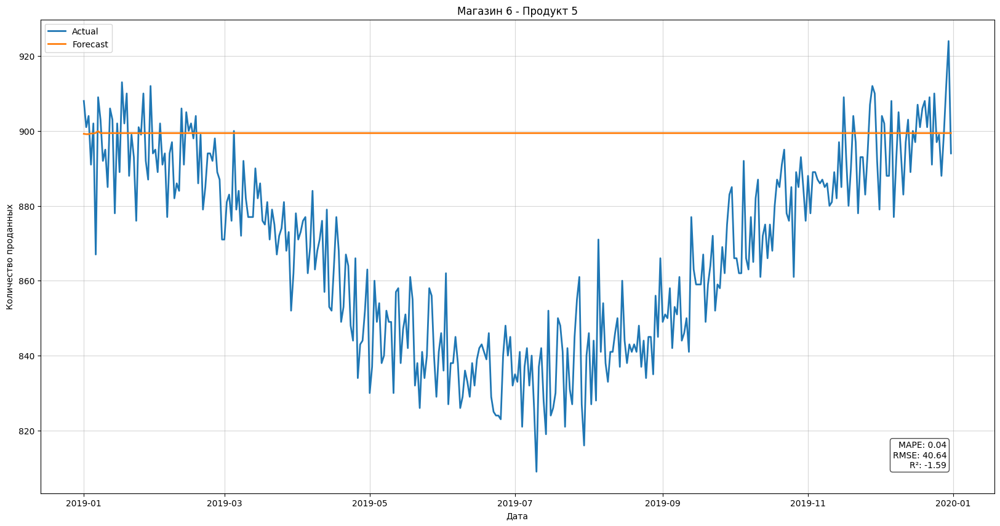

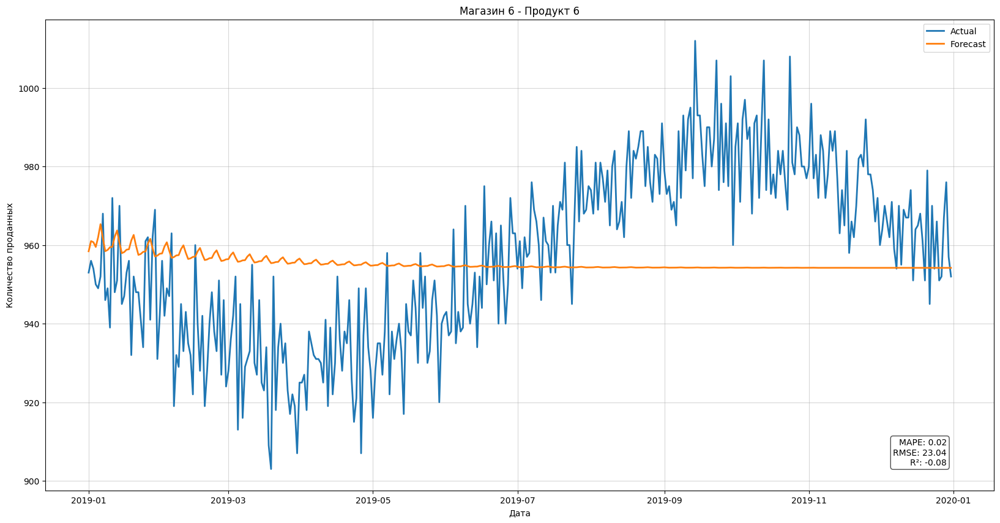

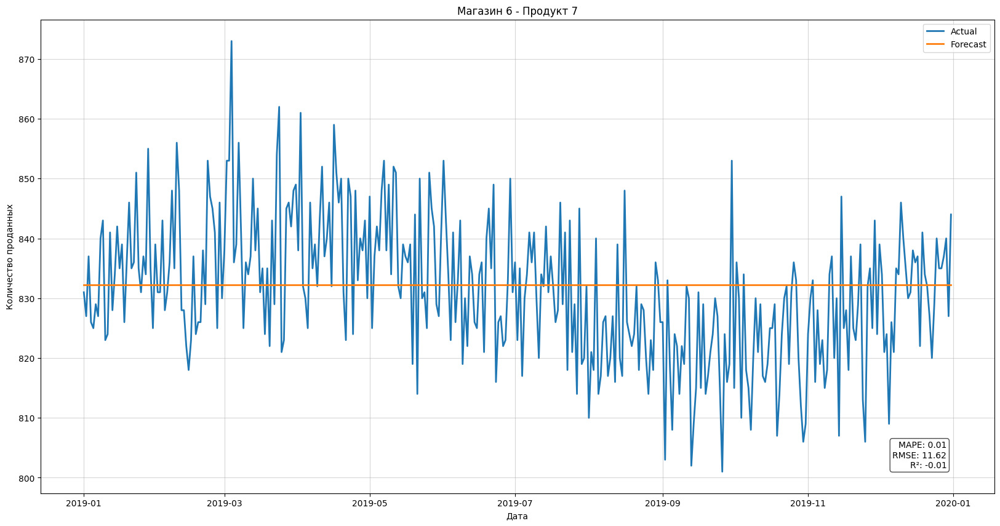

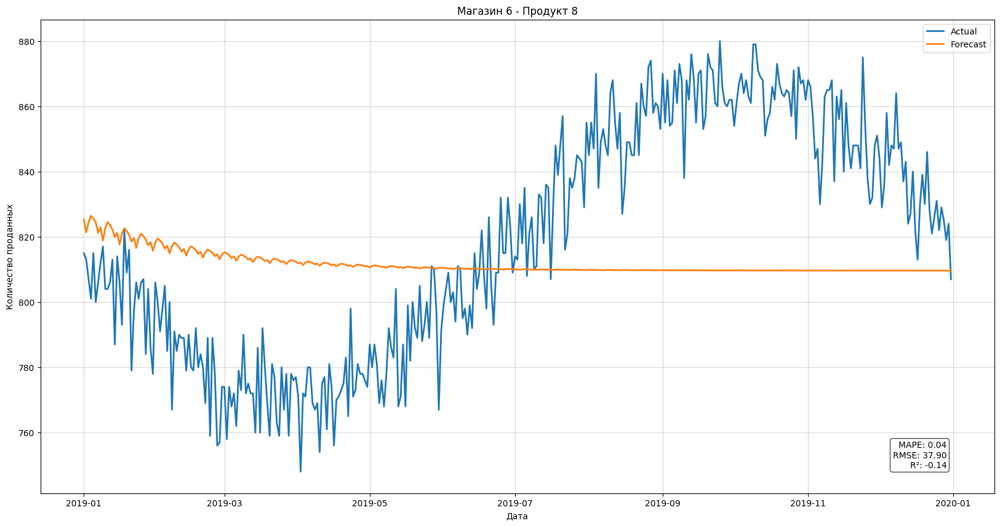

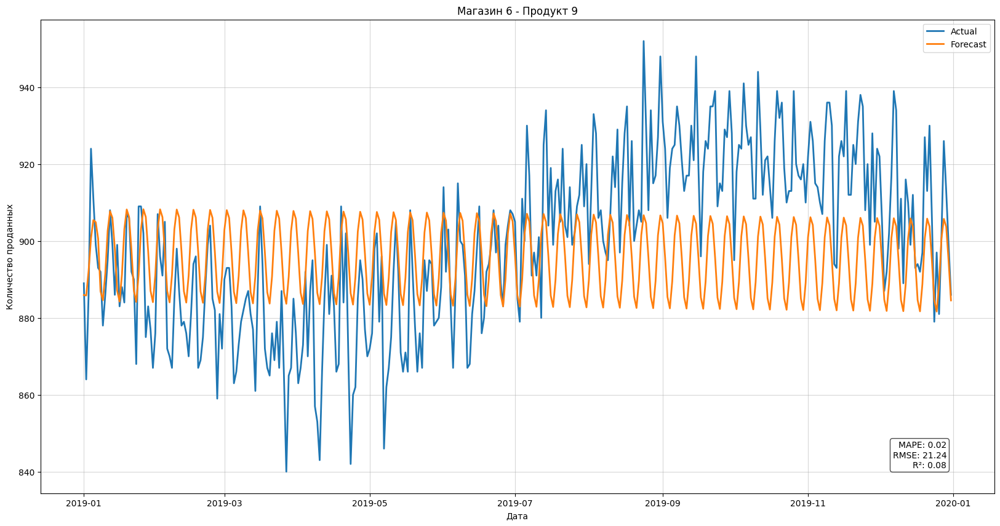

In [29]:
import matplotlib.pyplot as plt

plots = []

for (store, product), group in results_final.groupby(['store', 'product']):
    fig, ax = plt.subplots(figsize=(20, 10))

    ax.plot(group['Date'], group['Factual'], label='Actual', linewidth=2)
    ax.plot(group['Date'], group['Forecast'], label='Forecast', linewidth=2)

    ax.set_title(f'Магазин {store} - Продукт {product}')
    ax.set_xlabel('Дата')
    ax.set_ylabel('Количество проданных')
    ax.legend()

    # Добавляем текст с метриками в угол графика
    mape = group['mape'].iloc[0]
    rmse = group['rmse'].iloc[0]
    r2 = group['r2'].iloc[0]

    metrics_text = f"MAPE: {mape:.2f}\nRMSE: {rmse:.2f}\nR²: {r2:.2f}"
    ax.text(0.95, 0.05, metrics_text,
            transform=ax.transAxes,
            fontsize=10,
            verticalalignment='bottom',
            horizontalalignment='right',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))

    ax.grid(True, alpha=0.5, linestyle="-")
    plots.append(fig)
